## Importing Libraries

In [ ]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

# Downloading all the required libraries


# Importing all the required libraries
import os
import numpy as np
import pandas as pd
import re
import cv2
import string
import networkx as nx
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
style.use('ggplot')

IMG_SIZE = 32
NUM_CLASSES = 11

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M==1:
        row_size = figsize
        col_size = figsize//4
    elif N==1:
        row_size = figsize//4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M==1 and N==1:
                ax = axes
            elif M == 1 or N==1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()
    plt.clf()

## Q1: Food Classification using Logistic Regression [7 Marks]

Given a 11 classes of food, you need to complete the boilerplate code for Food Classification using Logistic Regression.

You can take help from following resource:

1. [[Link](https://elcaiseri.medium.com/building-a-simple-logistic-regression-model-from-scratch-with-numpy-c8cf2439d059)]

### Part A: Learning Model [3 marks]

In [ ]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def compute_loss(y_true, y_pred):
    # Write your code here
    m = len(y_true)
    loss = -1/m * np.sum(y_true * np.log(y_pred + 1e-15) + (1 - y_true) * np.log(1 - y_pred + 1e-15))
    return loss


class LogisticRegressionOvA:
    def __init__(self, learning_rate=0.01, epochs=1000):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.weights = None
        self.classes = ["Bread", "Dairy Products", "Dessert", "Egg", "Fried Food", "Meat", "Noodles-Pasta", "Rice", "Seafood", "Soup", "Vegetable-Fruit"]
        self.bias = None

    def fit(self, X, y, num_classes):
        """
        Train logistic regression for each class using one-vs-all approach.
        """
        num_samples, num_features = X.shape
        self.weights = np.zeros((num_classes, num_features))
        self.bias = np.zeros(num_classes)

        for class_idx in range(num_classes):
            y_binary = (y == class_idx).astype(int)
            for _ in range(self.epochs):
                linear_model = np.dot(X, self.weights[class_idx]) + self.bias[class_idx]
                y_pred = sigmoid(linear_model)

                # Compute gradients
                dw = 1/num_samples * np.dot(X.T, (y_pred - y_binary))
                db = 1/num_samples * np.sum(y_pred - y_binary)

                # Update weights
                self.weights[class_idx] -= self.learning_rate * dw
                self.bias[class_idx] -= self.learning_rate * db

    def predict(self, X):
        """
        Predict class labels using one-vs-all approach.
        """
        linear_model = np.dot(X, self.weights.T) + self.bias
        y_pred = sigmoid(linear_model)
        return np.argmax(y_pred, axis=1)

In [ ]:
def load_images_from_folder(folder_path):
    images = []
    labels = []
    print('Loading datasets...')
    for class_id, class_name in enumerate(tqdm(["Bread", "Dairy Products", "Dessert", "Egg", "Fried Food", "Meat", "Noodles-Pasta", "Rice", "Seafood", "Soup", "Vegetable-Fruit"])):
        for img_path in natsorted(glob(f"{folder_path}/{class_name}/*")):  # Modify extension if needed
            img = cv2.imread(img_path, cv2.IMREAD_COLOR)
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            images.append(np.float32(img.flatten())/255.0)
            labels.append(class_id)
    return np.array(images), np.array(labels)

In [ ]:
X, y = load_images_from_folder("/content/drive/My Drive/ES670MM/dataset/C/food11/")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

Loading datasets...


100%|██████████| 11/11 [00:29<00:00,  2.69s/it]


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


# print('\n Dataset shape: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)
print('\n Dataset shape: ', X_train.shape, X_test.shape, y_train.shape, y_test.shape)


 Dataset shape:  (2620, 3072) (292, 3072) (2620,) (292,)


In [ ]:

# model = LogisticRegressionOvA(learning_rate=0.01, epochs=1000)
model = LogisticRegressionOvA(learning_rate=0.01, epochs=1000)


In [ ]:
# model.fit(X_train, y_train, NUM_CLASSES)
model.fit(X_train, y_train, NUM_CLASSES)

In [ ]:
# y_pred = model.predict(X_test)
y_pred = model.predict(X_test)

# accuracy = accuracy_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)

# print(f"Model Accuracy: {accuracy:.2f}")
print(f"Model Accuracy: {accuracy:.2f}")

Model Accuracy: 0.26


### Part B: Weights Visualization [2 marks]

Once we train our Logistic Regression model, we will have the trained weights of shape [num_classes, feature_size]. We know that feature size is equal to (32 x 32 x 3 = 3072). Now your job is to visualize the features that is being learned using weight matrix. So there will be total 10 plots.

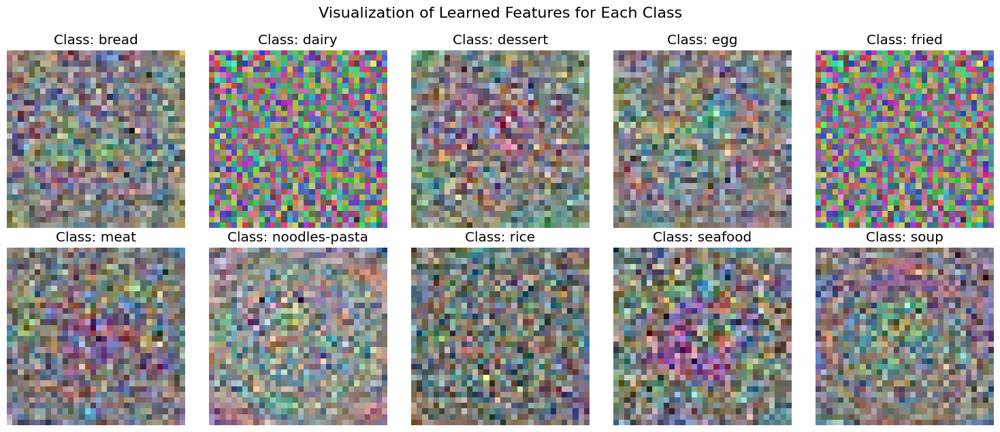

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define class names
class_names = [
    "bread", "dairy", "dessert", "egg", "fried",
    "meat", "noodles-pasta", "rice", "seafood", "soup", "vegetable-fruit"
]

# Create subplots: 2 rows, 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
axes = axes.flatten()

# Get model weights (assumed to be of shape: [num_classes, 32*32*3])
weights = model.weights  # Make sure model has attribute `weights` as numpy array

# Visualize weights for the first 10 classes
for idx in range(10):
    # Reshape the weights into image format
    img = weights[idx].reshape(32, 32, 3)

    # Normalize to [0, 1] range for display
    img = (img - img.min()) / (img.max() - img.min())

    # Display the image
    axes[idx].imshow(img)
    axes[idx].set_title(f"Class: {class_names[idx]}")
    axes[idx].axis('off')

# Layout and title
plt.tight_layout()
plt.suptitle("Visualization of Learned Features for Each Class", y=1.05, fontsize=16)
plt.show()


### Part C: Image Retrieval [2 marks]

Similar Assignment A, your task is to write image retrival code using the feature learned using Logistic Regression (W matrix). Here instead of mean images we have the learned weights for each class of dim 3072. Discuss how the accuracy you obtain here vary from the simple mean based image classification.

In [ ]:
def image_lookup_fn(model_weight, query_image, mean_img_classes):


    # Write your code here
    # You have to search among mean_images which one is closest to the query image
    # return the class of mean image which has the highest matching score

    def cosine_sim(image1, image2):


      dot_p = np.dot(image1, image2.T)
      norm_vec1 = np.linalg.norm(image1)
      norm_vec2 = np.linalg.norm(image2)

      value = dot_p/(norm_vec1*norm_vec2)

      return dot_p/(norm_vec1*norm_vec2)

    similarity = {}
    for idx, mean_image in enumerate(model_weight):
      similarity[idx] = cosine_sim(mean_image, query_image)
    best_match_idx = max(similarity, key=similarity.get)

    return mean_img_classes[best_match_idx]

100%|██████████| 110/110 [00:00<00:00, 129.85it/s]


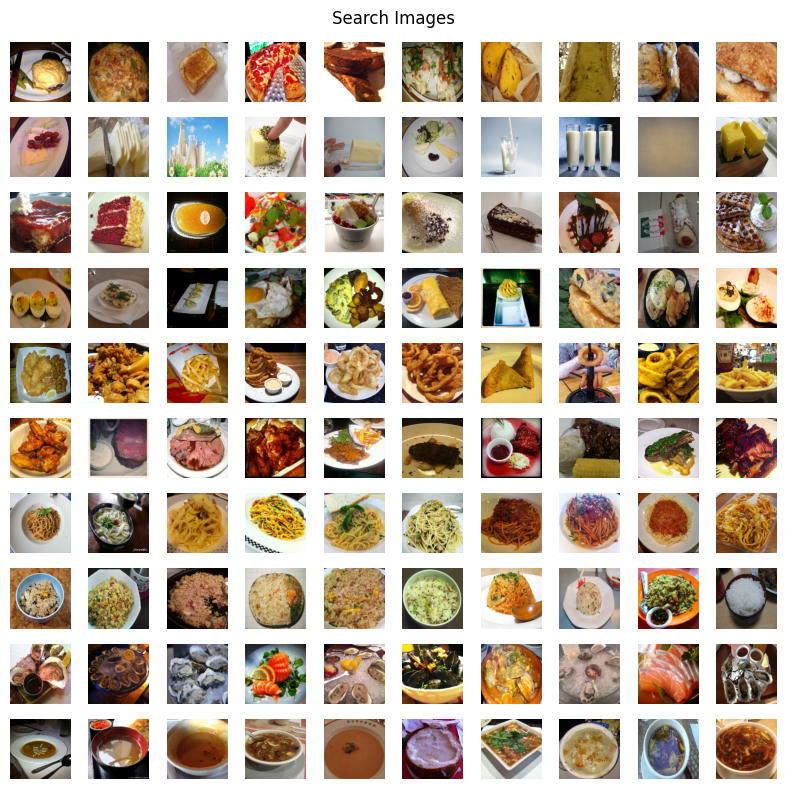

<Figure size 640x480 with 0 Axes>

In [ ]:
search_images = []
search_img_classes = []

for files in tqdm(natsorted(glob('/content/drive/My Drive/ES670MM/dataset/A/images/search_images/*'))):
    search_images.append(cv2.imread(files, 1))
    search_img_classes.append(os.path.splitext(os.path.basename(files))[0].split('_')[0])

search_images = np.array(search_images)
show_image_grid(search_images, 10, 10, 'Search Images', figsize=8)

100%|██████████| 110/110 [00:00<00:00, 5119.55it/s]


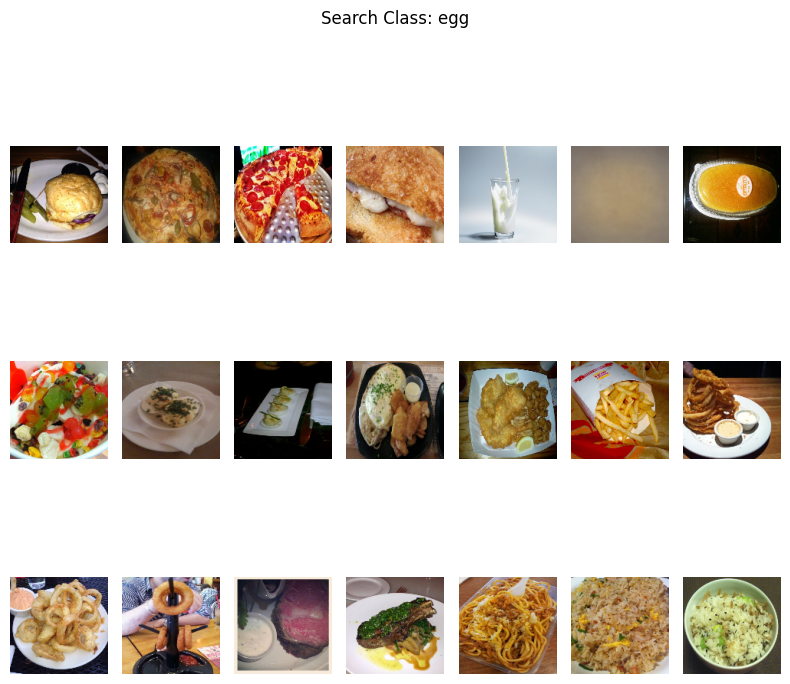

<Figure size 640x480 with 0 Axes>

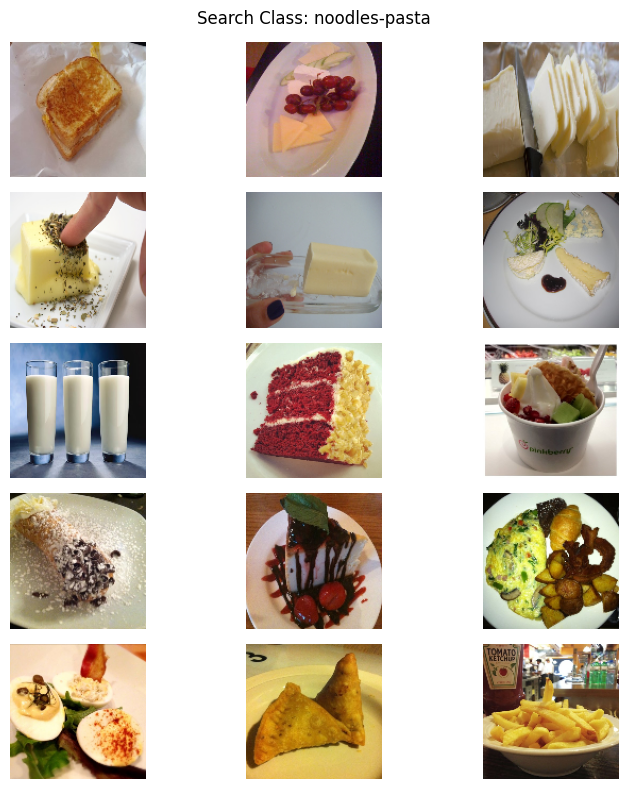

<Figure size 640x480 with 0 Axes>

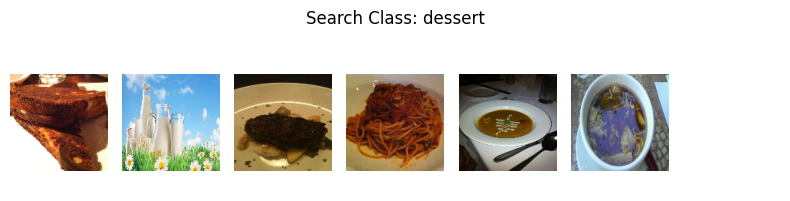

<Figure size 640x480 with 0 Axes>

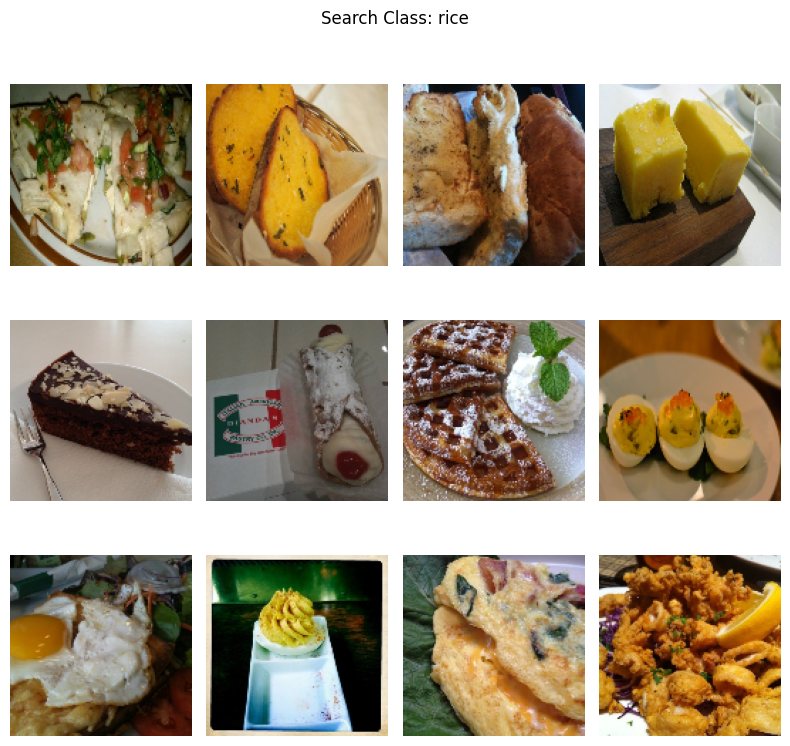

<Figure size 640x480 with 0 Axes>

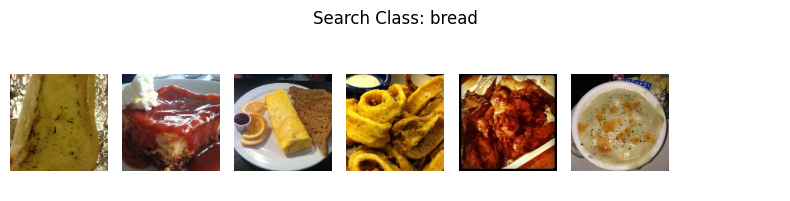

<Figure size 640x480 with 0 Axes>

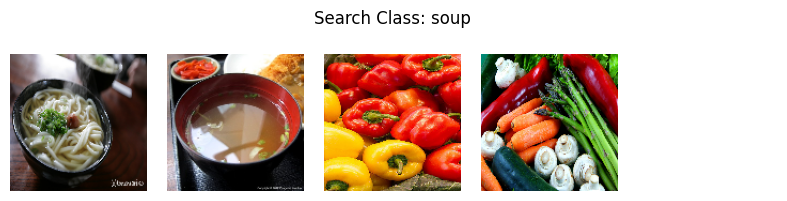

<Figure size 640x480 with 0 Axes>

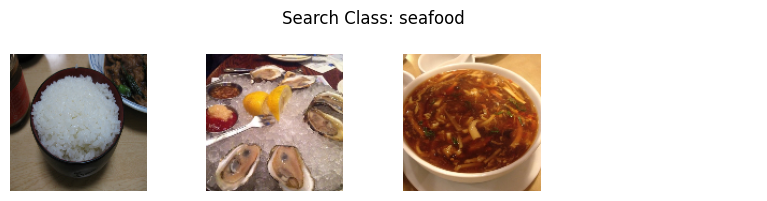

<Figure size 640x480 with 0 Axes>

In [ ]:
pred_classes = []
cluster_images = {}

for query_image in tqdm(search_images):

    query_image_ = cv2.resize(query_image, (IMG_SIZE, IMG_SIZE))
    query_image_ = np.float32(query_image_.flatten())/255.0

    pred_classes.append(image_lookup_fn(model.weights, query_image_, class_names))
    if pred_classes[-1] in cluster_images:
        cluster_images[pred_classes[-1]].append(query_image)
    else:
        cluster_images[pred_classes[-1]] = [query_image]

for class_name, img_lst in cluster_images.items():
    img_lst = np.array(img_lst)
    M = img_lst.shape[0]//10 + 1
    N = img_lst.shape[0]%10 + 1
    show_image_grid(img_lst, M, N, f'Search Class: {class_name}', figsize=8)

## Q2: Image Segmentation using Page Rank [3 Marks]

Given a list of grayscale images, your task is to perform image segmentation using Page Rank algorithm. You have to write Page Rank algorithm from scratch.

In [ ]:
def image_to_graph(image):
    height, width = image.shape
    G = nx.Graph()

    for y in range(height):
        for x in range(width):
            G.add_node((y, x), intensity=image[y, x])

    for y in range(height):
        for x in range(width):
            current_pixel = (y, x)
            neighbors = [(y+dy, x+dx) for dy in [-1, 0, 1] for dx in [-1, 0, 1]
                         if 0 <= y+dy < height and 0 <= x+dx < width and (dy, dx) != (0, 0)]

            for neighbor in neighbors:
                weight = np.exp(-abs(image[y, x] - image[neighbor]) / 255.0)
                G.add_edge(current_pixel, neighbor, weight=weight)

    return G

In [ ]:
def pagerank(G, alpha, weight):

    # Write your code here
    max_iter = 100
    tol=1e-6

    nodes = list(G.nodes())
    n = len(nodes)

    node_index = {node: i for i, node in enumerate(nodes)}

    pr = {node: 1.0 / n for node in nodes}

    personalization = {node: 1.0 / n for node in nodes}

    outgoing_weights = {}
    for node in nodes:
        neighbors = list(G.neighbors(node))
        if len(neighbors) > 0:
            outgoing_weights[node] = sum(G[node][neighbor].get(weight, 1.0) for neighbor in neighbors)
        else:
            outgoing_weights[node] = 0.0

    for _ in range(max_iter):
        prev_pr = pr.copy()

        for node in nodes:

            rank_sum = 0.0
            for neighbor in G.neighbors(node):

                if outgoing_weights[neighbor] == 0.0:
                    continue

                edge_weight = G[neighbor][node].get(weight, 1.0)

                rank_sum += prev_pr[neighbor] * (edge_weight / outgoing_weights[neighbor])

            pr[node] = (1.0 - alpha) * personalization[node] + alpha * rank_sum

        err = sum(abs(pr[node] - prev_pr[node]) for node in nodes)
        if err < tol:
            break

    s = sum(pr.values())
    pr = {node: val / s for node, val in pr.items()}

    return pr

In [ ]:
def segment_using_pagerank(G, image_shape):
    pr = pagerank(G, alpha=0.85, weight='weight')  # Compute PageRank

    pr_values = np.array([pr[node] for node in G.nodes()]).reshape(image_shape)

    # Normalize scores
    pr_values = (pr_values - pr_values.min()) / (pr_values.max() - pr_values.min())

    # Threshold the top 30% highest ranked pixels as foreground
    threshold = np.percentile(pr_values, 70)
    segmentation = (pr_values > threshold).astype(np.uint8) * 255

    return pr_values, segmentation

In [ ]:
def load_image_page_rank(image_path, size=(128, 128)):
    img = cv2.imread(image_path)
    img = cv2.resize(img, size)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    return img

100%|██████████| 110/110 [00:00<00:00, 162.79it/s]


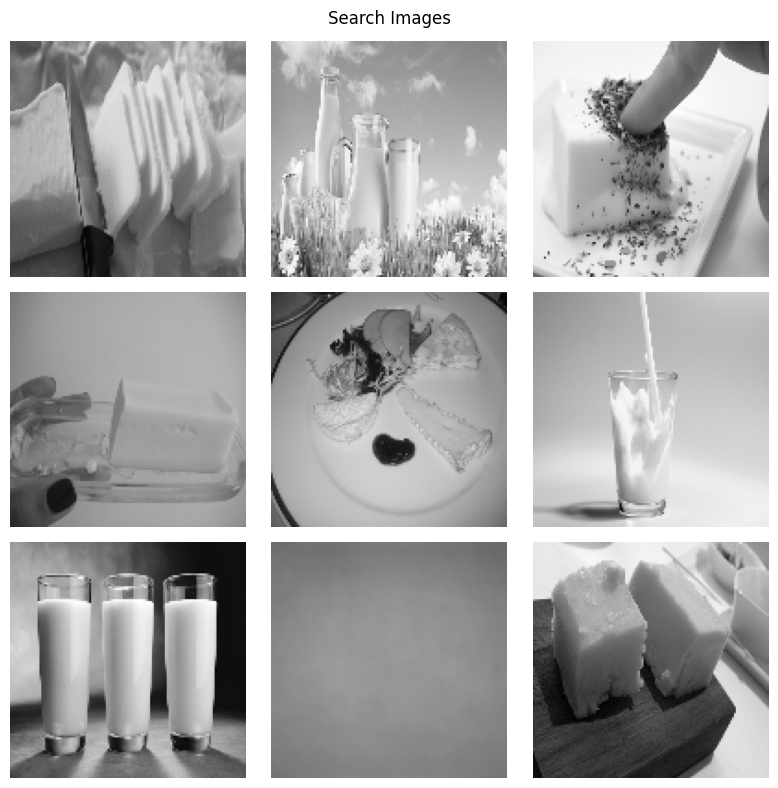

<Figure size 640x480 with 0 Axes>

In [ ]:
src_images = []

for files in tqdm(natsorted(glob('/content/drive/My Drive/ES670MM/dataset/A/images/search_images/*'))):
    src_images.append(load_image_page_rank(files))

src_images = np.array(src_images)[11:22]
show_image_grid(np.tile(np.expand_dims(src_images, axis=-1), (1, 1, 3)), 3, 3, 'Search Images', figsize=8)

<ipython-input-54-976354ea1260>:16: RuntimeWarning: overflow encountered in scalar negative
  weight = np.exp(-abs(image[y, x] - image[neighbor]) / 255.0)
<ipython-input-54-976354ea1260>:16: RuntimeWarning: overflow encountered in scalar subtract
  weight = np.exp(-abs(image[y, x] - image[neighbor]) / 255.0)


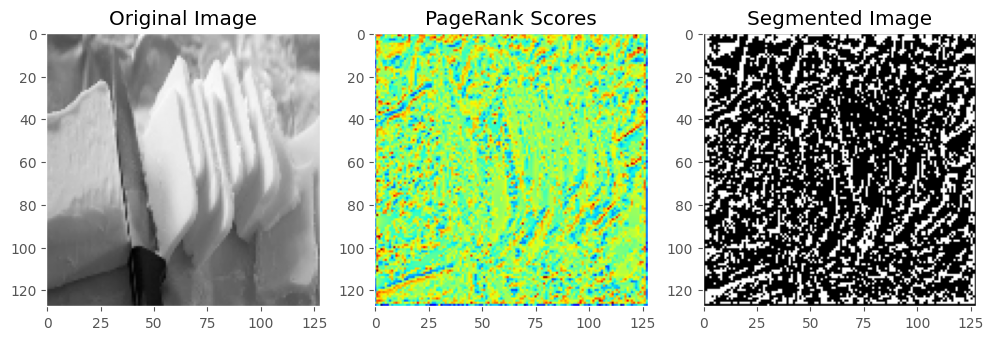

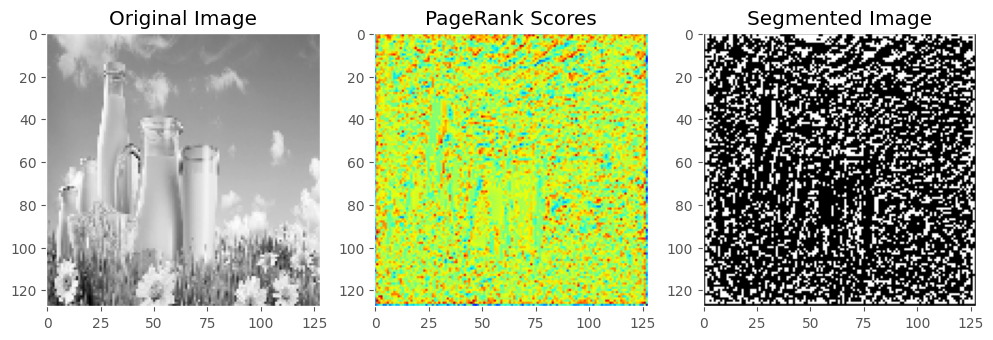

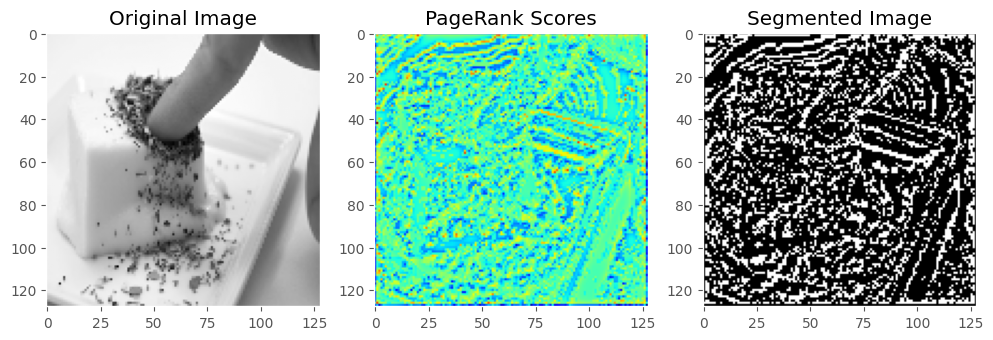

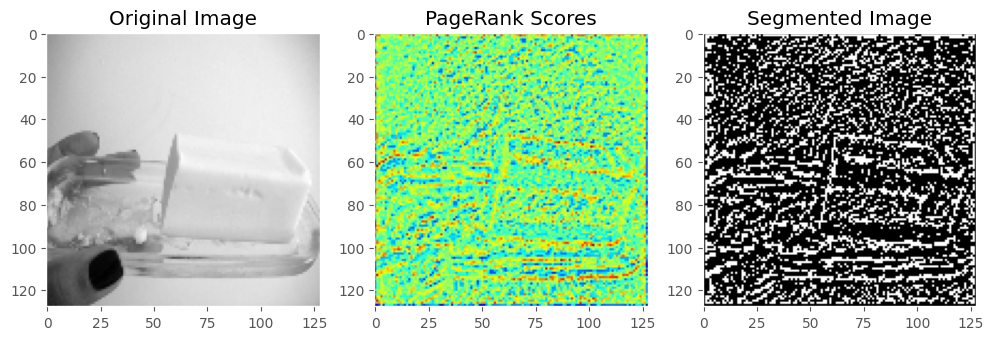

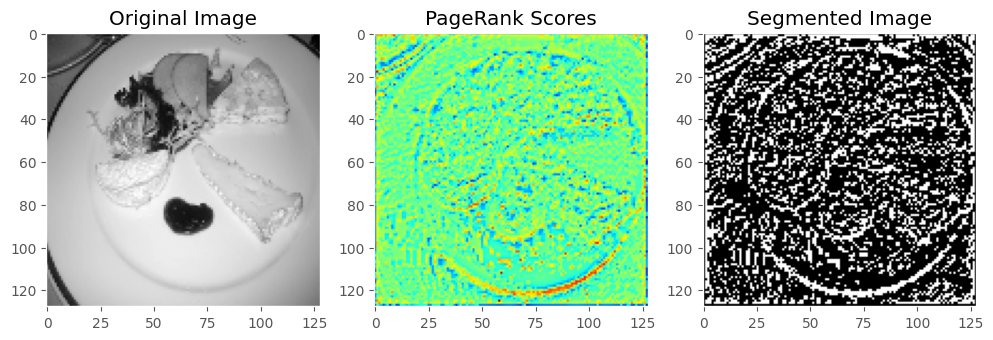

...

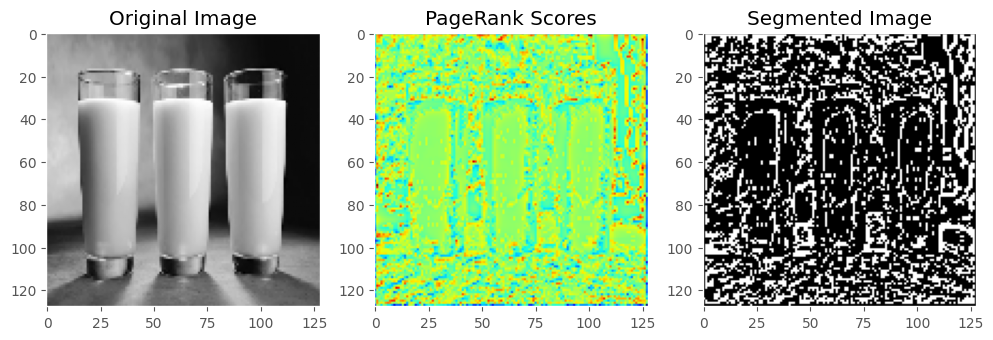

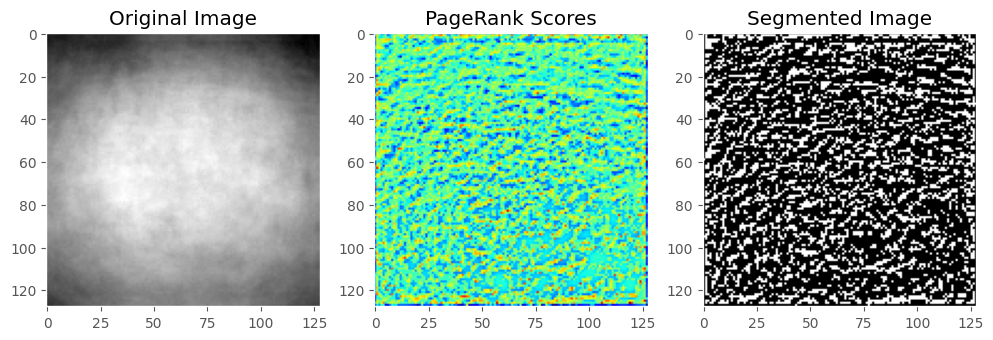

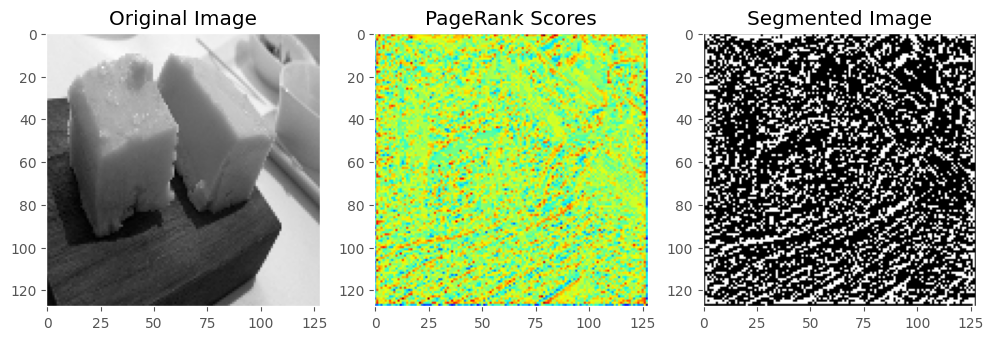

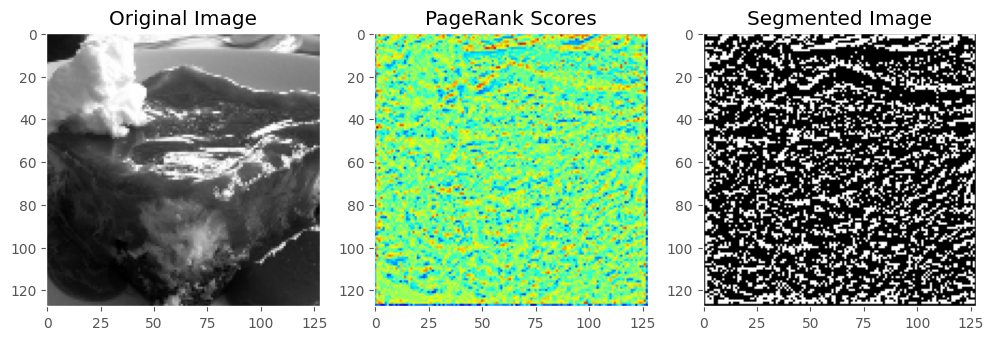

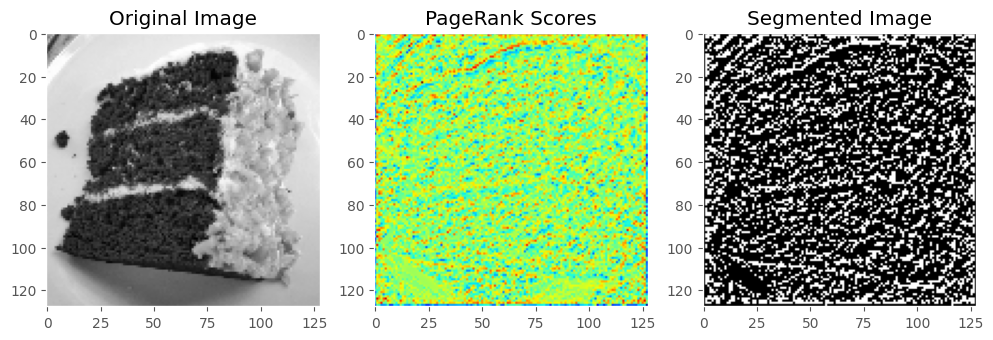

In [ ]:
for img in src_images:
    G = image_to_graph(img)
    pr_values, segmentation = segment_using_pagerank(G, img.shape)

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.grid(False)
    plt.imshow(img, cmap='gray')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(pr_values, cmap='jet')
    plt.grid(False)
    plt.title("PageRank Scores")

    plt.subplot(1, 3, 3)
    plt.imshow(segmentation, cmap='gray')
    plt.grid(False)
    plt.title("Segmented Image")

    plt.show()